In [122]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy as sp
import scipy.stats as stats
import pandas as pd
from sklearn.preprocessing import OneHotEncoder
import re
data = pd.read_csv('../data_mid_bootcamp_project_FIFA_MoneyBall/fifa21_male2.csv')

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error



pd.set_option('display.max_rows',None) #Display all rows
# pd.set_option('display.max_columns', None`)
import warnings
warnings.filterwarnings('ignore')

In [123]:
num_rows = data.shape[0] 
num_columns = data.shape[1]
print('Number of rows = {}'.format(num_rows))
print('Number of columns = {}'.format(num_columns))

Number of rows = 17125
Number of columns = 107


In [124]:
data.columns

Index(['ID', 'Name', 'Age', 'OVA', 'Nationality', 'Club', 'BOV', 'BP',
       'Position', 'Player Photo',
       ...
       'CDM', 'RDM', 'RWB', 'LB', 'LCB', 'CB', 'RCB', 'RB', 'GK', 'Gender'],
      dtype='object', length=107)

In [125]:
data.isna().sum()

ID                      0
Name                    0
Age                     0
OVA                     0
Nationality             0
Club                   23
BOV                     0
BP                      0
Position              413
Player Photo            0
Club Logo              23
Flag Photo              0
POT                     0
Team & Contract         0
Height                  0
Weight                  0
foot                    0
Growth                  0
Joined                 58
Loan Date End       16215
Value                   0
Wage                    0
Release Clause          0
Contract                0
Attacking               0
Crossing                0
Finishing               0
Heading Accuracy        0
Short Passing           0
Volleys                58
Skill                   0
Dribbling               0
Curve                  58
FK Accuracy             0
Long Passing            0
Ball Control            0
Movement                0
Acceleration            0
Sprint Speed

## Cleaning

In [126]:
data1 = data.copy()
data1  = data1[['Name','Age', 'Nationality', 'Value', 'Wage', 'foot', 'Height', 'Weight', 'BP', 'OVA', 'Contract']]
data1.head()

,Name,Age,Nationality,Value,Wage,foot,Height,Weight,BP,OVA,Contract
0,G. Pasquale,33,Italy,€625K,€7K,Left,"6'0""",181lbs,LWB,69,2008 ~ 2016
1,Luis García,37,Spain,€600K,€7K,Right,"5'10""",143lbs,CM,71,2014 ~ 2019
2,J. Cole,33,England,€1.1M,€15K,Right,"5'9""",161lbs,CAM,71,2016 ~ 2020
3,D. Yorke,36,Trinidad &amp; Tobago,€0,€0,Right,"5'11""",165lbs,ST,68,2009
4,Iniesta,36,Spain,€5.5M,€12K,Right,"5'7""",150lbs,CAM,81,2018 ~ 2021


In [127]:
data1 = data1.set_index('Name')
data1.head()

,Age,Nationality,Value,Wage,foot,Height,Weight,BP,OVA,Contract
Name,,,,,,,,,,
G. Pasquale,33,Italy,€625K,€7K,Left,"6'0""",181lbs,LWB,69,2008 ~ 2016
Luis García,37,Spain,€600K,€7K,Right,"5'10""",143lbs,CM,71,2014 ~ 2019
J. Cole,33,England,€1.1M,€15K,Right,"5'9""",161lbs,CAM,71,2016 ~ 2020
D. Yorke,36,Trinidad &amp; Tobago,€0,€0,Right,"5'11""",165lbs,ST,68,2009
Iniesta,36,Spain,€5.5M,€12K,Right,"5'7""",150lbs,CAM,81,2018 ~ 2021


In [128]:
# new data frame with split value columns 
split=data1["Contract"].str.split("~", n = 1, expand = True) 
  
# making separate first name column from new data frame 
data1["Start"]= split[0] 
  
# making separate last name column from new data frame 
data1["End"]= split[1] 

data1.drop(columns=["Contract"])
  
# df display 
split.head()

,0,1
Name,,
G. Pasquale,2008,2016
Luis García,2014,2019
J. Cole,2016,2020
D. Yorke,2009,None
Iniesta,2018,2021


In [129]:
data1['End']=pd.to_numeric(data1['End'])

In [130]:
active_players=data1[data1['End']>=2021]
active_players.head(10)

,Age,Nationality,Value,Wage,foot,Height,Weight,BP,OVA,Contract,Start,End
Name,,,,,,,,,,,,
Iniesta,36,Spain,€5.5M,€12K,Right,"5'7""",150lbs,CAM,81,2018 ~ 2021,2018,2021.0
R. Keane,35,Republic of Ireland,€5.5M,€10K,Right,"5'9""",161lbs,CF,80,2011 ~ 2022,2011,2022.0
G. Buffon,42,Italy,€2.2M,€41K,Right,"6'4""",203lbs,GK,82,2019 ~ 2021,2019,2021.0
M. Stekelenburg,37,Netherlands,€325K,€5K,Right,"6'6""",203lbs,GK,72,2020 ~ 2021,2020,2021.0
K. Ellison,41,England,€0,€2K,Left,"5'11""",168lbs,ST,58,2020 ~ 2021,2020,2021.0
Tarantini,36,Portugal,€975K,€6K,Right,"6'2""",172lbs,CM,72,2008 ~ 2021,2008,2021.0
S. Wright-Phillips,34,England,€425K,€6K,Right,"5'5""",141lbs,CAM,68,2016 ~ 2023,2016,2023.0
Yuri,37,Brazil,€850K,€6K,Right,"6'1""",172lbs,ST,71,2017 ~ 2021,2017,2021.0
F. Lampard,38,England,€575K,€8K,Right,"6'0""",196lbs,CM,78,2015 ~ 2023,2015,2023.0


In [131]:
active_players['Wage'] = active_players['Wage'].str.replace('€', '')
active_players['Value'] = active_players['Value'].str.replace('€', '')
active_players.head(10)

,Age,Nationality,Value,Wage,foot,Height,Weight,BP,OVA,Contract,Start,End
Name,,,,,,,,,,,,
Iniesta,36,Spain,5.5M,12K,Right,"5'7""",150lbs,CAM,81,2018 ~ 2021,2018,2021.0
R. Keane,35,Republic of Ireland,5.5M,10K,Right,"5'9""",161lbs,CF,80,2011 ~ 2022,2011,2022.0
G. Buffon,42,Italy,2.2M,41K,Right,"6'4""",203lbs,GK,82,2019 ~ 2021,2019,2021.0
M. Stekelenburg,37,Netherlands,325K,5K,Right,"6'6""",203lbs,GK,72,2020 ~ 2021,2020,2021.0
K. Ellison,41,England,0,2K,Left,"5'11""",168lbs,ST,58,2020 ~ 2021,2020,2021.0
Tarantini,36,Portugal,975K,6K,Right,"6'2""",172lbs,CM,72,2008 ~ 2021,2008,2021.0
S. Wright-Phillips,34,England,425K,6K,Right,"5'5""",141lbs,CAM,68,2016 ~ 2023,2016,2023.0
Yuri,37,Brazil,850K,6K,Right,"6'1""",172lbs,ST,71,2017 ~ 2021,2017,2021.0
F. Lampard,38,England,575K,8K,Right,"6'0""",196lbs,CM,78,2015 ~ 2023,2015,2023.0


In [132]:
def value_to_float(x):
    if type(x) == float or type(x) == int:
        return x
    if 'K' in x:
        if len(x) > 1:
            return float(x.replace ('K','')) * 1000
        return 1000.0
    if 'M' in x:
        if len(x) > 1:
            return float(x.replace ('M','')) * 1000000
        return 1000000

In [133]:
active_players['Wage'] = active_players['Wage'].apply(value_to_float)
active_players['Value'] = active_players['Value'].apply(value_to_float)

In [134]:
active_players.dropna(inplace=True)
active_players.head()

,Age,Nationality,Value,Wage,foot,Height,Weight,BP,OVA,Contract,Start,End
Name,,,,,,,,,,,,
Iniesta,36,Spain,5500000.0,12000.0,Right,"5'7""",150lbs,CAM,81,2018 ~ 2021,2018,2021.0
R. Keane,35,Republic of Ireland,5500000.0,10000.0,Right,"5'9""",161lbs,CF,80,2011 ~ 2022,2011,2022.0
G. Buffon,42,Italy,2200000.0,41000.0,Right,"6'4""",203lbs,GK,82,2019 ~ 2021,2019,2021.0
M. Stekelenburg,37,Netherlands,325000.0,5000.0,Right,"6'6""",203lbs,GK,72,2020 ~ 2021,2020,2021.0
Tarantini,36,Portugal,975000.0,6000.0,Right,"6'2""",172lbs,CM,72,2008 ~ 2021,2008,2021.0


In [135]:
active_players.dtypes

Age              int64
Nationality     object
Value          float64
Wage           float64
foot            object
Height          object
Weight          object
BP              object
OVA              int64
Contract        object
Start           object
End            float64
dtype: object

In [136]:
active_players.isna().sum()

Age            0
Nationality    0
Value          0
Wage           0
foot           0
Height         0
Weight         0
BP             0
OVA            0
Contract       0
Start          0
End            0
dtype: int64

In [137]:
active_players.head()

,Age,Nationality,Value,Wage,foot,Height,Weight,BP,OVA,Contract,Start,End
Name,,,,,,,,,,,,
Iniesta,36,Spain,5500000.0,12000.0,Right,"5'7""",150lbs,CAM,81,2018 ~ 2021,2018,2021.0
R. Keane,35,Republic of Ireland,5500000.0,10000.0,Right,"5'9""",161lbs,CF,80,2011 ~ 2022,2011,2022.0
G. Buffon,42,Italy,2200000.0,41000.0,Right,"6'4""",203lbs,GK,82,2019 ~ 2021,2019,2021.0
M. Stekelenburg,37,Netherlands,325000.0,5000.0,Right,"6'6""",203lbs,GK,72,2020 ~ 2021,2020,2021.0
Tarantini,36,Portugal,975000.0,6000.0,Right,"6'2""",172lbs,CM,72,2008 ~ 2021,2008,2021.0


In [138]:
def convert_to_cm(x):
    values = re.findall(r'\d+', x) 
    ft = int(values[0])
    try:
        inches = int(values[1])
    except IndexError:
        inches = 0
    return (ft * 12 + inches)*2.54



In [139]:
active_players['Height'] = active_players['Height'].apply(convert_to_cm)

In [140]:
active_players.head()

,Age,Nationality,Value,Wage,foot,Height,Weight,BP,OVA,Contract,Start,End
Name,,,,,,,,,,,,
Iniesta,36,Spain,5500000.0,12000.0,Right,170.18,150lbs,CAM,81,2018 ~ 2021,2018,2021.0
R. Keane,35,Republic of Ireland,5500000.0,10000.0,Right,175.26,161lbs,CF,80,2011 ~ 2022,2011,2022.0
G. Buffon,42,Italy,2200000.0,41000.0,Right,193.04,203lbs,GK,82,2019 ~ 2021,2019,2021.0
M. Stekelenburg,37,Netherlands,325000.0,5000.0,Right,198.12,203lbs,GK,72,2020 ~ 2021,2020,2021.0
Tarantini,36,Portugal,975000.0,6000.0,Right,187.96,172lbs,CM,72,2008 ~ 2021,2008,2021.0


In [141]:
active_players['Weight'] = active_players['Weight'].str.replace('lbs', '')
active_players['Weight']= pd.to_numeric(active_players['Weight'])*.454

active_players.dtypes
active_players.head()

active_players_new = active_players.drop(columns=['Contract', 'Start', 'End'])

## EDA

In [142]:
''' Check  '''
active_players_new.describe().apply(lambda x: round(x,2)).T

,count,mean,std,min,25%,50%,75%,max
Age,11141.0,25.41,4.43,16.00,22.00,25.00,28.00,4.200000e+01
Value,11141.0,3283896.42,6325928.27,15000.00,525000.00,1000000.00,3300000.00,1.055000e+08
Wage,11141.0,13496.90,24242.13,1000.00,2000.00,5000.00,15000.00,5.600000e+05
Height,11141.0,181.43,6.86,154.94,177.80,180.34,185.42,2.057400e+02
Weight,11141.0,75.36,7.17,49.94,69.92,74.91,79.90,1.103200e+02
OVA,11141.0,68.16,6.46,47.00,64.00,68.00,72.00,9.300000e+01


In [143]:
'''Players by Overall Score '''

ova_players = active_players_new.sort_values(['OVA'],ascending=[False]).head(10)
ova_players.head(10)

,Age,Nationality,Value,Wage,foot,Height,Weight,BP,OVA
Name,,,,,,,,,
L. Messi,33,Argentina,67500000.0,560000.0,Left,170.18,72.186,RW,93
Cristiano Ronaldo,35,Portugal,46000000.0,220000.0,Right,187.96,83.082,ST,92
K. De Bruyne,29,Belgium,87000000.0,370000.0,Right,180.34,69.916,CAM,91
R. Lewandowski,31,Poland,80000000.0,240000.0,Right,182.88,79.904,ST,91
Neymar Jr,28,Brazil,90000000.0,270000.0,Right,175.26,68.100,LW,91
J. Oblak,27,Slovenia,75000000.0,125000.0,Right,187.96,87.168,GK,91
V. van Dijk,28,Netherlands,75500000.0,210000.0,Right,193.04,92.162,CB,90
K. Mbappé,21,France,105500000.0,160000.0,Right,177.80,73.094,ST,90
Alisson,27,Brazil,62500000.0,160000.0,Right,190.50,91.254,GK,90


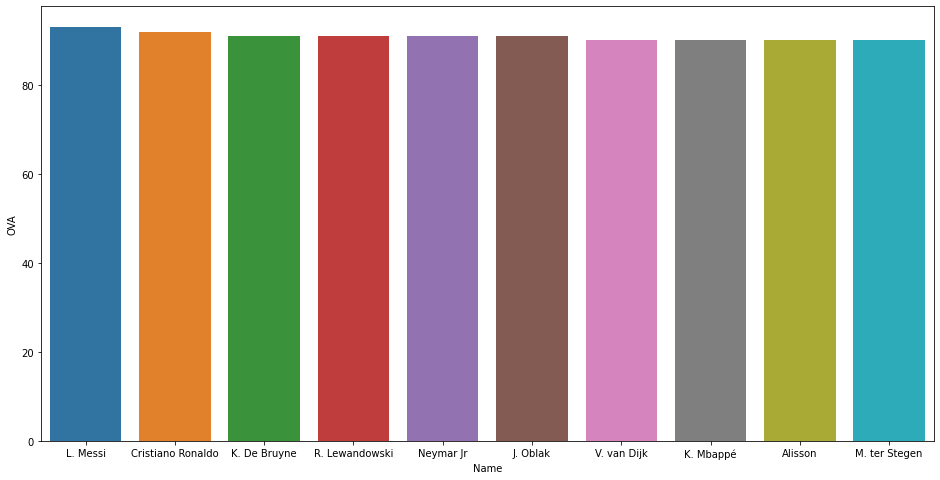

In [144]:
plt.figure(figsize=(16,8))

sns.barplot(x=ova_players.index, y="OVA", data=ova_players, ci = None)
plt.show()

In [149]:
'''Players by Value '''

value_players = active_players_new.sort_values(['Value'],ascending=[False]).head(50)
value_players

,Age,Nationality,Value,Wage,foot,Height,Weight,BP,OVA
Name,,,,,,,,,
K. Mbappé,21,France,105500000.0,160000.0,Right,177.80,73.094,ST,90
Neymar Jr,28,Brazil,90000000.0,270000.0,Right,175.26,68.100,LW,91
K. De Bruyne,29,Belgium,87000000.0,370000.0,Right,180.34,69.916,CAM,91
R. Lewandowski,31,Poland,80000000.0,240000.0,Right,182.88,79.904,ST,91
M. Salah,28,Egypt,78000000.0,250000.0,Left,175.26,71.278,RW,90
S. Mané,28,Senegal,78000000.0,250000.0,Right,175.26,69.008,LW,90
V. van Dijk,28,Netherlands,75500000.0,210000.0,Right,193.04,92.162,CB,90
J. Oblak,27,Slovenia,75000000.0,125000.0,Right,187.96,87.168,GK,91
R. Sterling,25,England,72500000.0,270000.0,Right,170.18,69.008,LW,88


In [150]:
value_counter = value_players['Nationality'].value_counts()

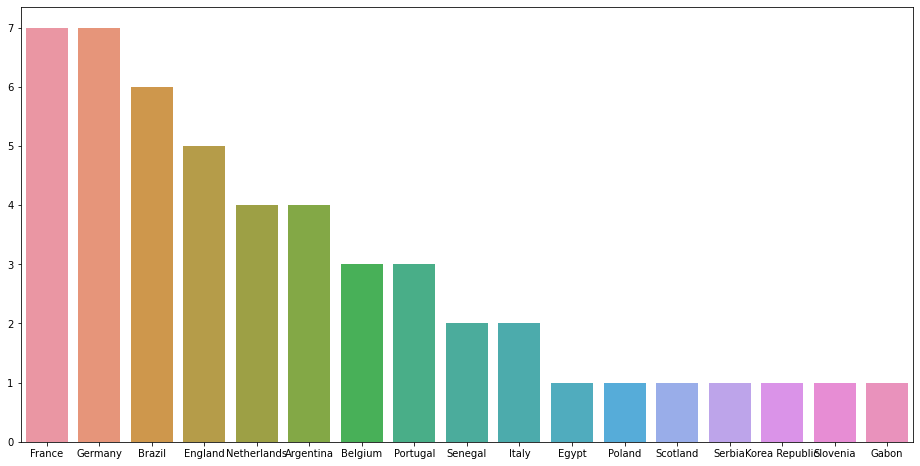

In [151]:
plt.figure(figsize=(16,8))

sns.barplot(x=value_counter.index, y=value_counter.values, data=value_players, ci = None)
plt.show()

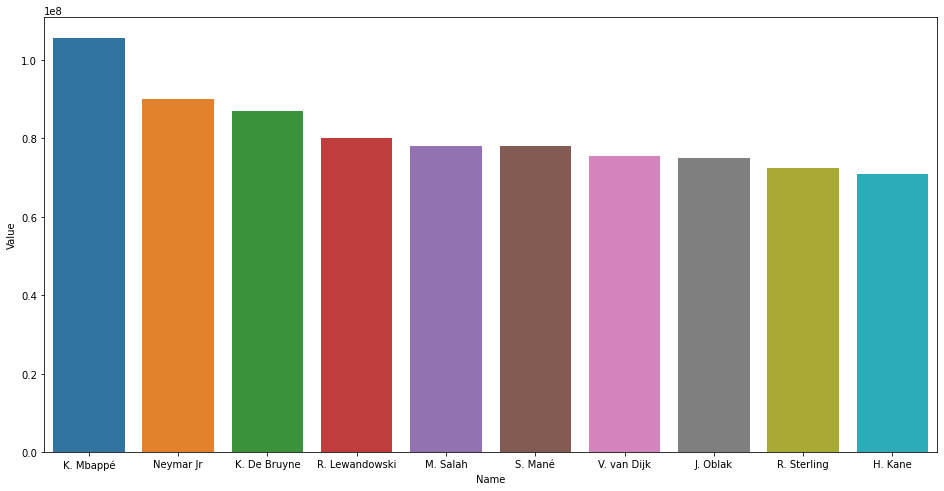

In [94]:
plt.figure(figsize=(16,8))

sns.barplot(x=value_players.index, y="Value", data=value_players, ci = None)
plt.show()

In [24]:
'''Players by Wage '''

value_players = active_players_new.sort_values(['Wage'],ascending=[False])
value_players.head(10)

,Age,Nationality,Value,Wage,foot,Height,Weight,BP,OVA
Name,,,,,,,,,
L. Messi,33,Argentina,67500000.0,560000.0,Left,170.18,72.186,RW,93
K. De Bruyne,29,Belgium,87000000.0,370000.0,Right,180.34,69.916,CAM,91
K. Benzema,32,France,53000000.0,350000.0,Right,185.42,81.266,CF,89
E. Hazard,29,Belgium,58000000.0,350000.0,Right,175.26,74.002,LW,88
Casemiro,28,Brazil,59500000.0,310000.0,Right,185.42,83.990,CDM,89
T. Kroos,30,Germany,55000000.0,310000.0,Right,182.88,76.272,CM,88
S. Agüero,32,Argentina,53000000.0,300000.0,Right,172.72,69.916,ST,89
Sergio Ramos,34,Spain,24500000.0,300000.0,Right,182.88,82.174,CB,89
A. Griezmann,29,France,50500000.0,290000.0,Left,175.26,73.094,ST,87


In [25]:
summary = active_players_new.describe().T
summary['iqr'] = summary['75%']-summary['25%']
summary = summary.apply(round) # lambda x: round(x, 2)
summary

,count,mean,std,min,25%,50%,75%,max,iqr
Age,11141.0,25.0,4.0,16.0,22.0,25.0,28.0,42.0,6.0
Value,11141.0,3283896.0,6325928.0,15000.0,525000.0,1000000.0,3300000.0,105500000.0,2775000.0
Wage,11141.0,13497.0,24242.0,1000.0,2000.0,5000.0,15000.0,560000.0,13000.0
Height,11141.0,181.0,7.0,155.0,178.0,180.0,185.0,206.0,8.0
Weight,11141.0,75.0,7.0,50.0,70.0,75.0,80.0,110.0,10.0
OVA,11141.0,68.0,6.0,47.0,64.0,68.0,72.0,93.0,8.0


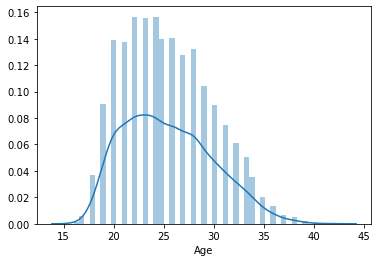

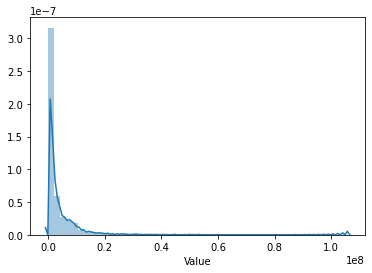

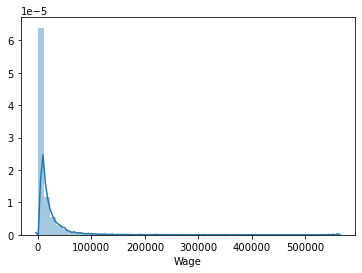

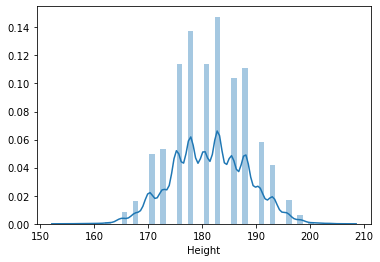

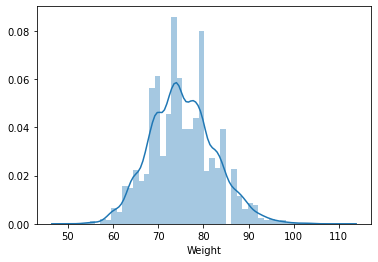

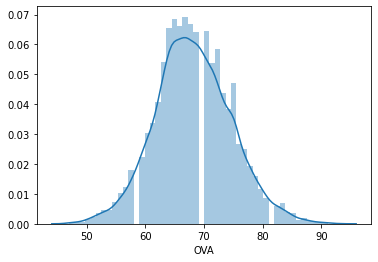

In [26]:
for column in active_players_new.select_dtypes(np.number).columns:
    sns.distplot(active_players_new[column])
    plt.show()

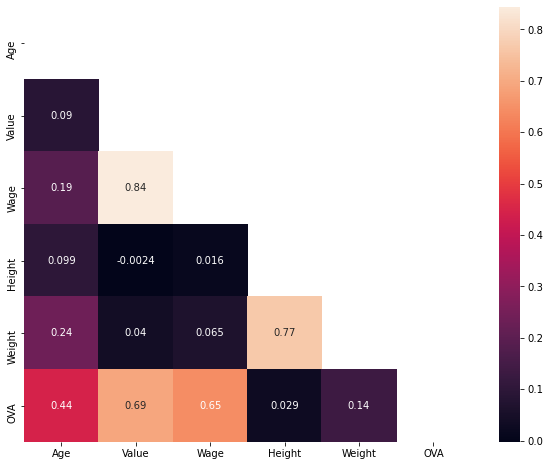

In [27]:
mask = np.zeros_like(active_players_new.corr())

mask[np.triu_indices_from(mask)] = True # optional, to hide repeat half of the matrix

fig, ax = plt.subplots(figsize=(10, 8))
ax = sns.heatmap(active_players_new.corr(), mask=mask, annot=True)
plt.show()

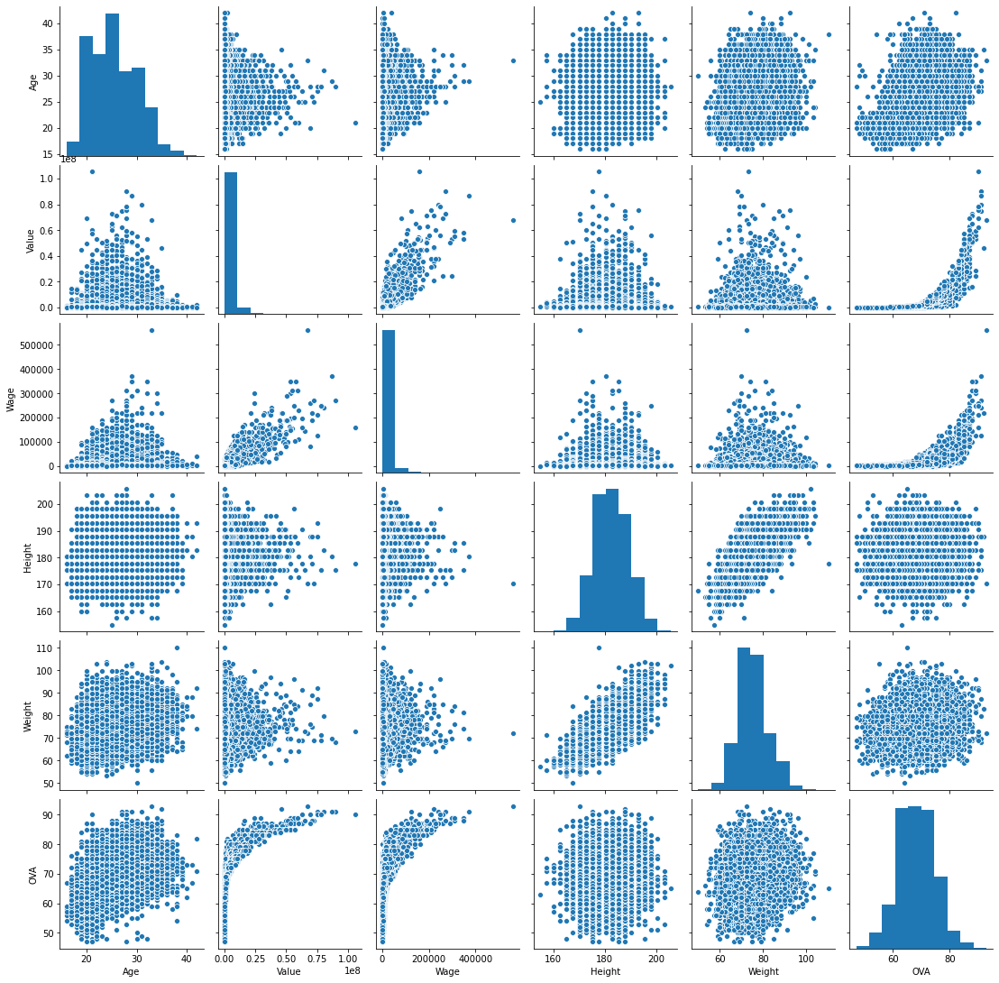

In [28]:
sns.pairplot(active_players_new)

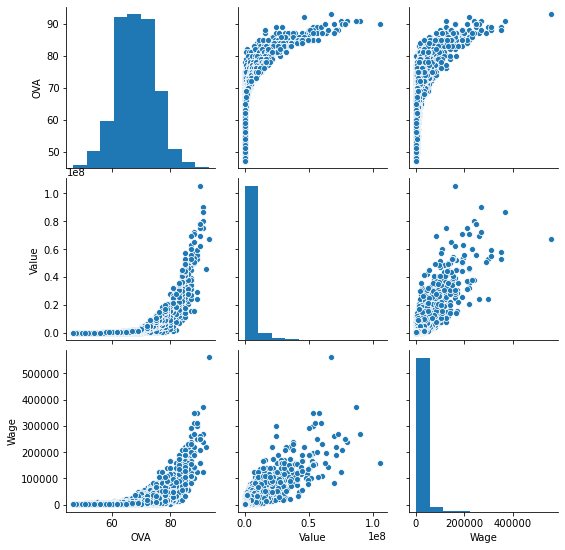

In [29]:
sns.pairplot(active_players_new[['OVA','Value','Wage']])

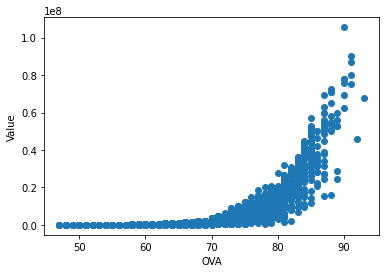

In [30]:
y = active_players['Value']
a = active_players['Age']
z = active_players['Wage']
x = active_players['OVA']

plt.scatter(x,y)
plt.xlabel('OVA')
plt.ylabel('Value')
plt.show()

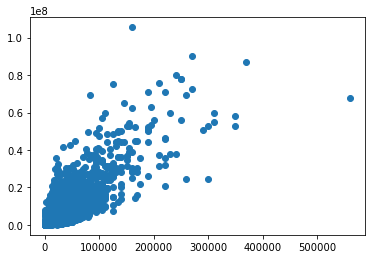

In [31]:
plt.scatter(z,y)
plt.show()

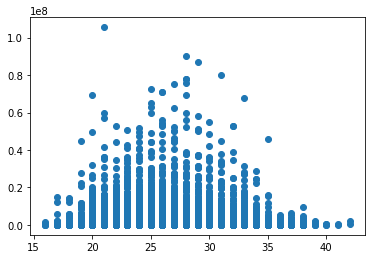

In [32]:
plt.scatter(a,y)
plt.show()

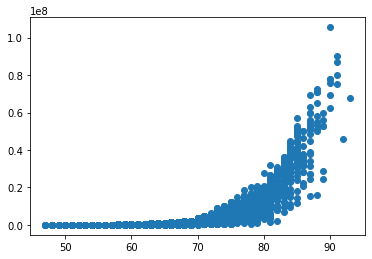

In [33]:
plt.scatter(x,y)
#plot.scatter(z,y)
plt.show()

# Feature Engineering

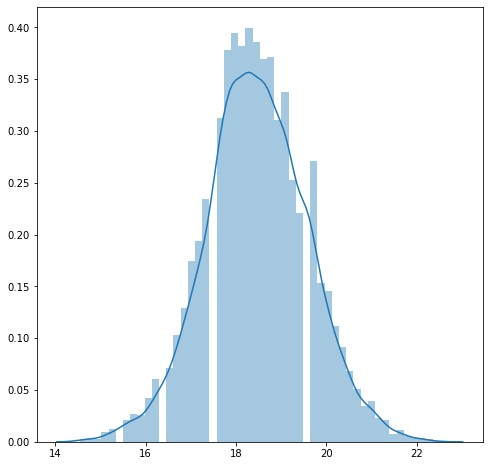

In [34]:
'Box Cox - OVA'
tdata = stats.boxcox(active_players_new['OVA']) [0]
plt.figure(figsize = (8,8))
sns.distplot(tdata)
plt.show()

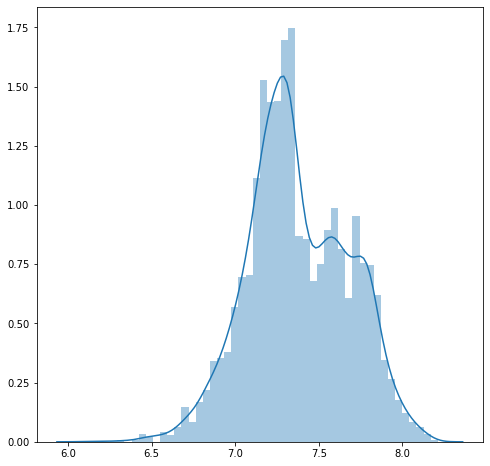

In [35]:
'Box Cox - Value'
tdata = stats.boxcox(active_players_new['Value']) [0]
plt.figure(figsize = (8,8))
sns.distplot(tdata)
plt.show()

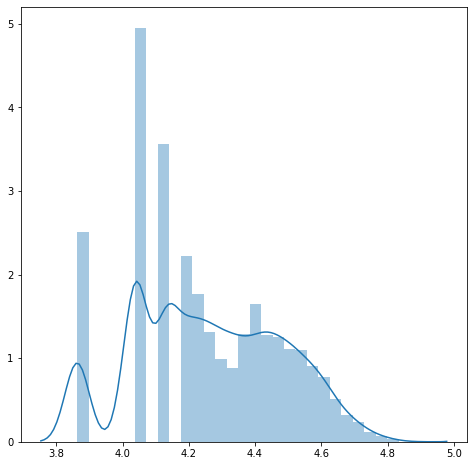

In [36]:
'Box Cox - Wage'
tdata = stats.boxcox(active_players_new['Wage']) [0]
plt.figure(figsize = (8,8))
sns.distplot(tdata)
plt.show()

In [37]:
active_players_new.dtypes

Age              int64
Nationality     object
Value          float64
Wage           float64
foot            object
Height         float64
Weight         float64
BP              object
OVA              int64
dtype: object

In [38]:
active_players_new.head(10)

,Age,Nationality,Value,Wage,foot,Height,Weight,BP,OVA
Name,,,,,,,,,
Iniesta,36,Spain,5500000.0,12000.0,Right,170.18,68.100,CAM,81
R. Keane,35,Republic of Ireland,5500000.0,10000.0,Right,175.26,73.094,CF,80
G. Buffon,42,Italy,2200000.0,41000.0,Right,193.04,92.162,GK,82
M. Stekelenburg,37,Netherlands,325000.0,5000.0,Right,198.12,92.162,GK,72
Tarantini,36,Portugal,975000.0,6000.0,Right,187.96,78.088,CM,72
S. Wright-Phillips,34,England,425000.0,6000.0,Right,165.10,64.014,CAM,68
Yuri,37,Brazil,850000.0,6000.0,Right,185.42,78.088,ST,71
F. Lampard,38,England,575000.0,8000.0,Right,182.88,88.984,CM,78
A. Robben,36,Netherlands,5000000.0,12000.0,Left,180.34,79.904,CAM,80


In [39]:
active_players_new.isna().sum()

Age            0
Nationality    0
Value          0
Wage           0
foot           0
Height         0
Weight         0
BP             0
OVA            0
dtype: int64

In [40]:
ci = stats.boxcox(active_players_new['Value'])
ci

(array([7.70555846, 7.70555846, 7.51390112, ..., 6.79284538, 7.14951682,
        7.04998467]),
 -0.10390323064865205)

In [41]:
# In the first run, I prefer not to have any scaling, just to have a benchmark on my metrics
# then i come back to these steps and check different scaling techniques to see which is better

# usually you'll choose one scaling technique for the whole dataframe

# if you are going for StandardScaler, MinMaxScaler or Normalizer, remember to do it after the splits:
## X-y split for Normalizer (you won't use normalizer on target variable)
## train-test split for the other two

# for this example i chose BoxCox transformation

def boxcox_transform(active_players_new):
    numeric_cols = active_players_new.select_dtypes(np.number).columns
    _ci = {column: None for column in numeric_cols}
    for column in numeric_cols:
        # since i know any columns should take negative numbers, to avoid -inf in df
        active_players_new[column] = np.where(active_players_new[column]<=0, np.NAN, active_players_new[column]) 
        active_players_new[column] = active_players_new[column].fillna(active_players_new[column].mean())
        transformed_data, ci = stats.boxcox(active_players_new[column]) # calculating lambda 
        active_players_new[column] = transformed_data
        _ci[column] = [ci] 
    return active_players, _ci

In [42]:
active_players_new, _ci = boxcox_transform(active_players)
active_players_new

,Age,Nationality,Value,Wage,foot,Height,Weight,BP,OVA,Contract,Start,End
Name,,,,,,,,,,,,
Iniesta,2.311764,Spain,7.705558,4.402961,Right,101.682129,4.993152,CAM,20.634845,2018 ~ 2021,2018,0.000649
R. Keane,2.300845,Republic of Ireland,7.705558,4.371361,Right,104.366537,5.091573,CF,20.473084,2011 ~ 2022,2011,0.000649
G. Buffon,2.370085,Italy,7.513901,4.589814,Right,113.688174,5.417755,GK,20.795780,2019 ~ 2021,2019,0.000649
M. Stekelenburg,2.322305,Netherlands,7.049985,4.240809,Right,116.331582,5.417755,GK,19.147365,2020 ~ 2021,2020,0.000649
Tarantini,2.311764,Portugal,7.327694,4.276818,Right,111.036138,5.183976,CM,19.147365,2008 ~ 2021,2008,0.000649
S. Wright-Phillips,2.289524,England,7.120750,4.276818,Right,98.987780,4.907540,CAM,18.461617,2016 ~ 2023,2016,0.000649
Yuri,2.322305,Brazil,7.294719,4.276818,Right,109.706803,5.183976,ST,18.977443,2017 ~ 2021,2017,0.000649
F. Lampard,2.332492,England,7.198161,4.331179,Right,108.375211,5.367999,CM,20.147021,2015 ~ 2023,2015,0.000649
A. Robben,2.311764,Netherlands,7.686462,4.402961,Left,107.041327,5.216230,CAM,20.473084,2020 ~ 2021,2020,0.000649


In [43]:
# splitting our data
X = active_players_new.drop('Value', axis=1)
y = active_players_new['Value']


In [44]:
# splitting our data
# X_O = active_players_new.drop('OVA', axis=1)
# y_O = active_players_new['OVA']

In [45]:
X_num = active_players_new.select_dtypes(include = np.number)
X_cat = active_players_new.select_dtypes(include = np.object)

X_cat = X_cat.drop('Contract', axis= 1)
X_cat = X_cat.drop('Start', axis= 1)
X_cat.head()

,Nationality,foot,BP
Name,,,
Iniesta,Spain,Right,CAM
R. Keane,Republic of Ireland,Right,CF
G. Buffon,Italy,Right,GK
M. Stekelenburg,Netherlands,Right,GK
Tarantini,Portugal,Right,CM


In [46]:
encoder = OneHotEncoder(handle_unknown='error', drop='first')
encoder.fit(X_cat)

OneHotEncoder(drop='first')

In [47]:
encoded = encoder.transform(X_cat).toarray()
encoded.shape

(11141, 163)

In [48]:
X_num.shape

(11141, 7)

In [49]:
X = np.concatenate([X_num, encoded], axis = 1)
X.shape

(11141, 170)

In [50]:
#Train Value
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [51]:
#Train OVA`
# X_train, X_test, y_train, y_test = train_test_split(X_O, y_O, test_size=0.3, random_state=42)

In [52]:
model = LinearRegression()
model.fit(X_train, y_train)

LinearRegression()

# Analyzing Results

In [53]:
predictions = model.predict(X_test)

In [54]:
r2_score(y_test, predictions), mean_absolute_error(y_test, predictions), mean_squared_error(y_test, predictions, squared=False)

(0.997180901997769, 0.00028697344265703385, 0.0159698142911202)

In [55]:
# MAE and MSE are log transformed
# have to inverse transform
from scipy.special import inv_boxcox

predictions = inv_boxcox(predictions, _ci['OVA'])

In [56]:
mean_absolute_error(y_test, predictions), mean_squared_error(y_test, predictions, squared=False)

(10.010746858097573, 10.03417354349064)

In [57]:
import math

results = pd.DataFrame()
results['true'] = inv_boxcox(y_test, _ci['OVA'])
results['pred'] = predictions
results['resid'] = results.apply(lambda x: abs(x['true'] - x['pred']), axis=1)
results.head(10)

,true,pred,resid
Name,,,
Enaldo Praz,17.392252,17.392252,3.161915e-13
M. Hamšík,19.059549,19.059549,3.552714e-13
Yang Liyu,17.211913,17.211913,3.090861e-13
J. Gaari,16.846567,16.846567,3.375078e-13
P. De la Vega,18.418161,18.418161,3.090861e-13
I. Abate,18.540202,18.540202,3.304024e-13
G. Harmon,15.593208,15.593208,3.055334e-13
A. Grønbæk,15.370889,15.370889,3.339551e-13
N. Freire,17.325504,17.325504,3.517187e-13


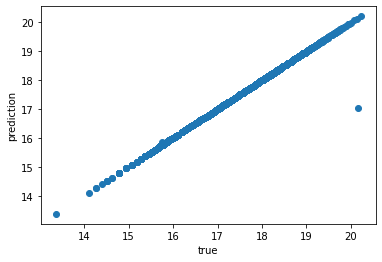

In [58]:
y = results['true']
x = results['pred']

plt.scatter(x,y)
plt.xlabel('true')
plt.ylabel('prediction')
plt.show()

In [59]:
results.describe()

,true,pred,resid
count,3343.000000,3343.000000,3.343000e+03
mean,17.378969,17.379864,9.627278e-04
std,0.984289,0.985496,5.370126e-02
min,13.368432,13.368432,1.776357e-14
25%,16.737726,16.737726,3.161915e-13
50%,17.232143,17.232143,3.339551e-13
75%,18.110983,18.110983,3.552714e-13
max,20.216592,20.216592,3.102917e+00
